# EDA (Exploratory Data Analysis)

We have 42 columns we cant to use to predict the price of an Airbnb unit:

In [ ]:
numerical = [
            'days_since_host', 'host_response_rate', 'host_acceptance_rate', 'host_total_listings_count', 
            'latitude','longitude', 'accommodates', 'bathroom_qty', 'bedrooms', 'beds',
            ]
categorical = [
                'host_response_time','host_is_superhost', 'host_verifications_email','host_verifications_phone',
                'host_verifications_work_email','host_has_profile_pic','host_identity_verified',
                'neighbourhood_cleansed', 'room_type', 'property_description', 'bathroom_type', 
                'gym','wifi','pool','kitchen','parking','washer','dryer','conditioning','heating','workspace',
                'tv','hair dryer','iron','hot tub','crib','king bed','bbq','breakfast','fireplace','smoking', 'coffee maker', 
               'instant_bookable',
              ]
label=['price']

In [ ]:
len(numerical + categorical)

43

In this notebook we will do some exploration to see the relationship between the price and these columns.

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

palette = ["#F72585", "#7209B7", "#3A0CA3", "#4361EE", "#4CC9F0"]
sns.set()

listings = pd.read_pickle("../data/listings_cleaned.pkl")
listings.head()

,days_since_host,host_response_rate,host_acceptance_rate,host_total_listings_count,latitude,longitude,accommodates,bathroom_qty,bedrooms,beds,...,hot tub,crib,king bed,bbq,breakfast,fireplace,smoking,coffee maker,instant_bookable,price
1,4359,1.0,0.83,7,19.43542,-99.13802,2,1.5,1.0,2.0,...,1,0,0,0,1,0,0,1,False,3506.0
2,4359,1.0,0.83,7,19.43423,-99.13718,4,2.5,2.0,4.0,...,0,0,0,0,1,0,0,1,False,5499.0
3,4077,1.0,0.98,10,19.43826,-99.13660,4,1.0,2.0,2.0,...,0,0,0,0,0,0,1,1,True,858.0
5,4792,1.0,0.82,17,19.41162,-99.17794,14,5.5,5.0,8.0,...,0,0,0,0,0,0,0,1,False,18000.0
6,4082,1.0,1.00,2,19.41936,-99.17281,3,1.0,1.0,1.0,...,0,1,0,0,0,0,1,1,True,3307.0


In [ ]:
len(listings)

20573

## 1. Label (Price)

<seaborn.axisgrid.FacetGrid>

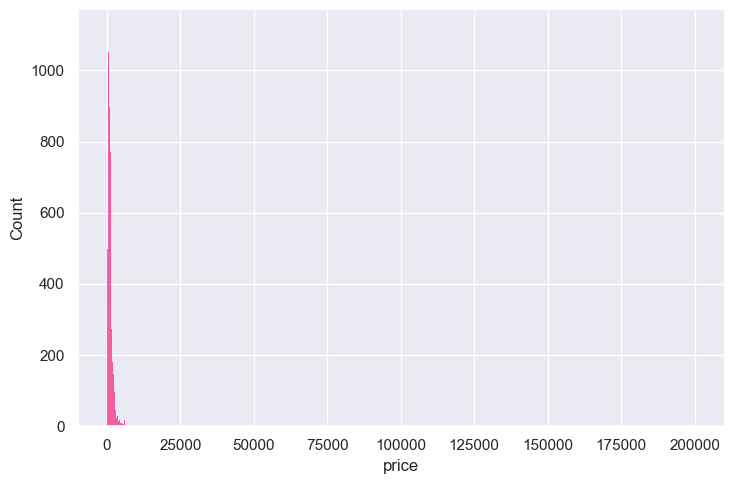

In [ ]:
sns.displot(data=listings[listings.price<200000], x="price", kind="hist", aspect=1.5, color=palette[0])

To handle skew due to high prices:

<seaborn.axisgrid.FacetGrid>

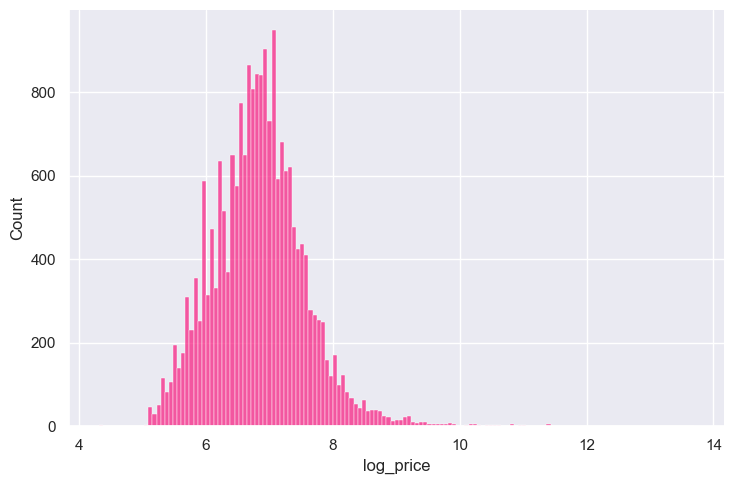

In [ ]:
listings.loc[:,"log_price"] = np.log(listings.loc[:,"price"])
sns.displot(data=listings, x="log_price", kind="hist", aspect=1.5, color=palette[0])

In [ ]:
label=['log_price']

In [ ]:
listings.dtypes

days_since_host                    int64
host_response_rate               float64
host_acceptance_rate             float64
host_total_listings_count          int64
latitude                         float64
longitude                        float64
accommodates                       int64
bathroom_qty                     float64
bedrooms                         float64
beds                             float64
host_response_time                object
host_is_superhost                   bool
host_verifications_email           int64
host_verifications_phone           int64
host_verifications_work_email      int64
host_has_profile_pic                bool
host_identity_verified              bool
neighbourhood_cleansed            object
room_type                         object
property_description              object
bathroom_type                     object
gym                                int64
wifi                               int64
pool                               int64
kitchen         

## 2. Numerical Features

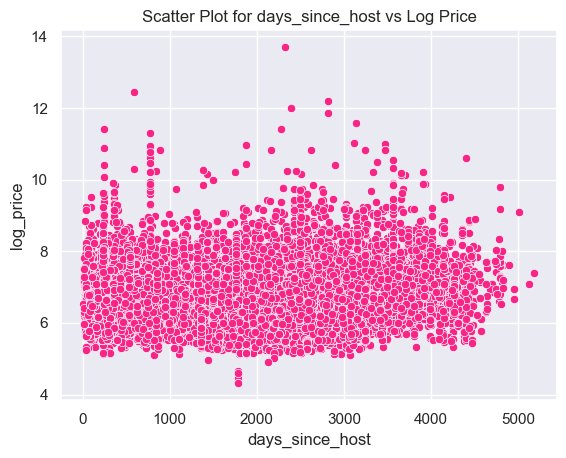

In [ ]:
column = 'days_since_host'
sns.scatterplot(x=column, y='log_price', data=listings, color=palette[0])
plt.title(f'Scatter Plot for {column} vs Log Price')
plt.show()

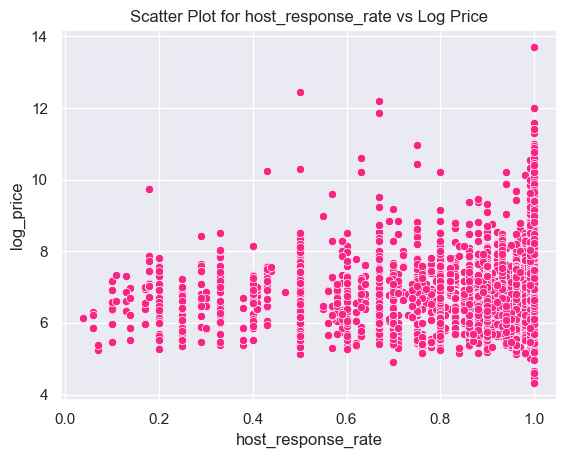

In [ ]:
column = 'host_response_rate'
sns.scatterplot(x=column, y='log_price', data=listings, color=palette[0])
plt.title(f'Scatter Plot for {column} vs Log Price')
plt.show()

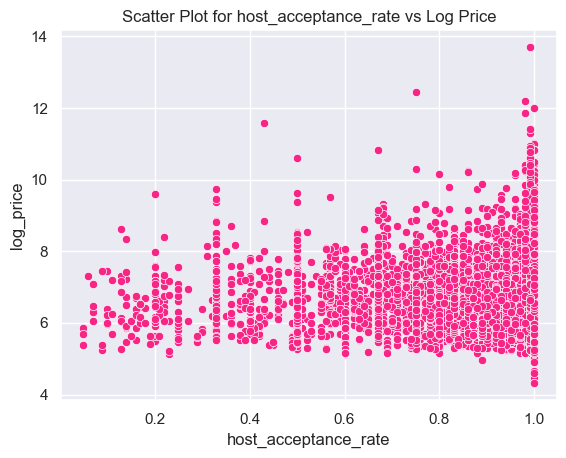

In [ ]:
column = 'host_acceptance_rate'
sns.scatterplot(x=column, y='log_price', data=listings, color=palette[0])
plt.title(f'Scatter Plot for {column} vs Log Price')
plt.show()

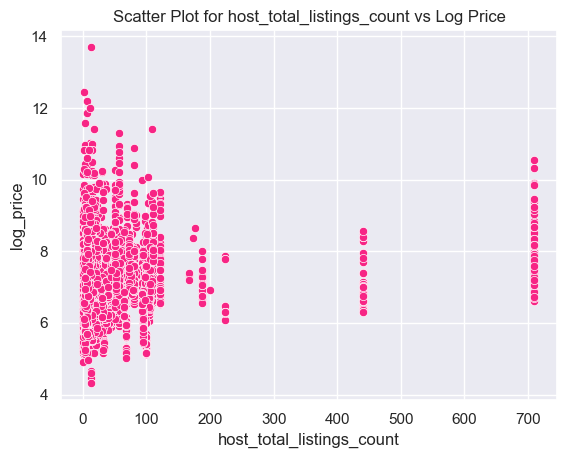

In [ ]:
column = 'host_total_listings_count'
sns.scatterplot(x=column, y='log_price', data=listings, color=palette[0])
plt.title(f'Scatter Plot for {column} vs Log Price')
plt.show()

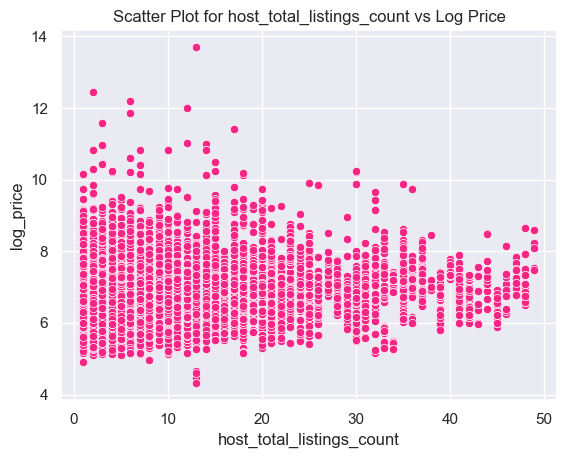

In [ ]:
# Without the host with many listings:
column = 'host_total_listings_count'
sns.scatterplot(x=column, y='log_price', data=listings[listings[column]<50], color=palette[0])
plt.title(f'Scatter Plot for {column} vs Log Price')
plt.show()

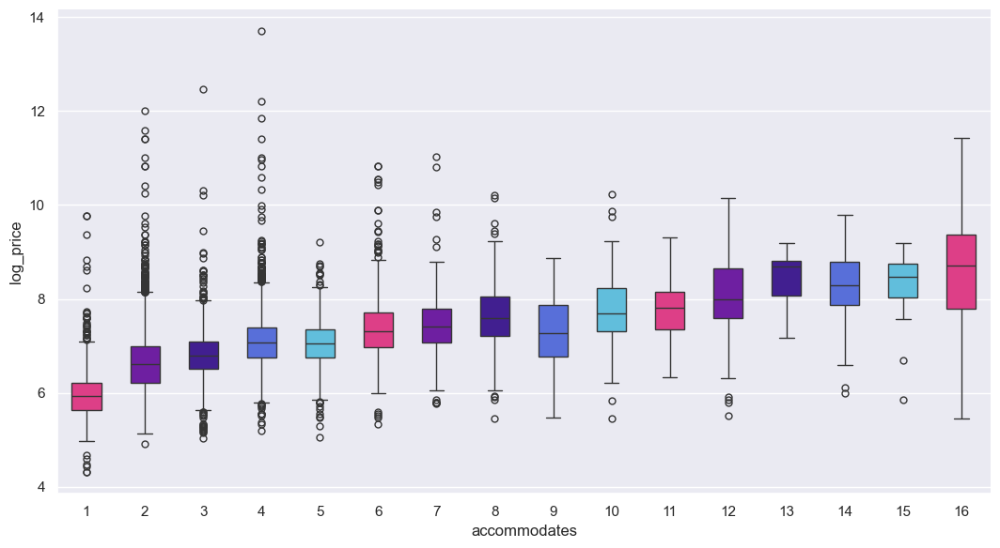

In [ ]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    sns.catplot(
        data=listings, 
        x='accommodates', y='log_price', kind='box',
        height=6, aspect=1.8, width=0.5, palette=palette, legend= False,
    )

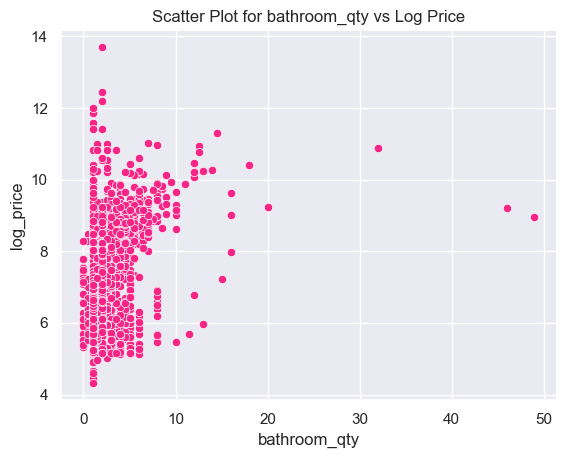

In [ ]:
# Without the host with many listings:
column = 'bathroom_qty'
sns.scatterplot(x=column, y='log_price', data=listings[listings[column]<50], color=palette[0])
plt.title(f'Scatter Plot for {column} vs Log Price')
plt.show()

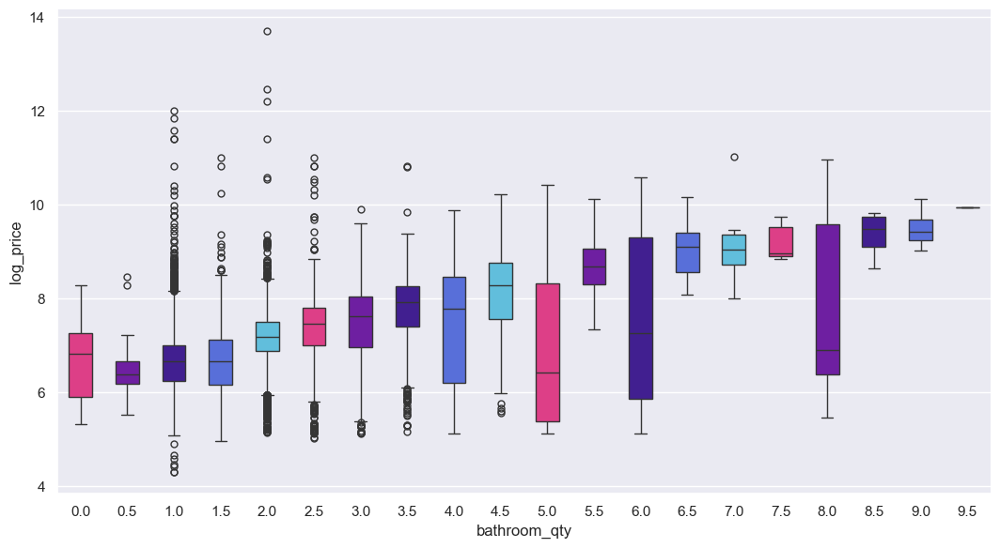

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    sns.catplot(
        data=listings[listings[column]<10], 
        x=column, y='log_price', kind='box',
        height=6, aspect=1.8, width=0.5, palette=palette, legend= False,
    )

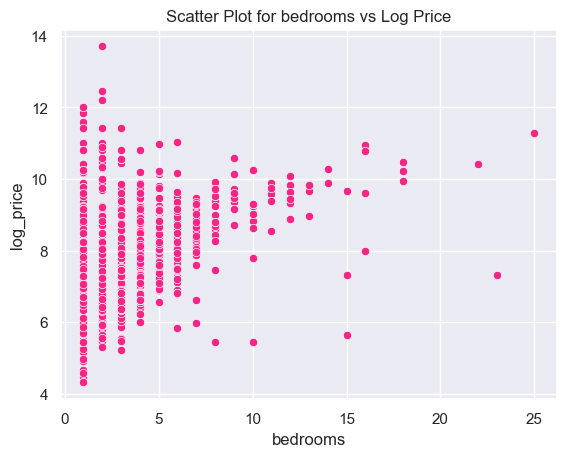

In [ ]:
# Without the host with many listings:
column = 'bedrooms'
sns.scatterplot(x=column, y='log_price', data=listings[listings[column]<50], color=palette[0])
plt.title(f'Scatter Plot for {column} vs Log Price')
plt.show()

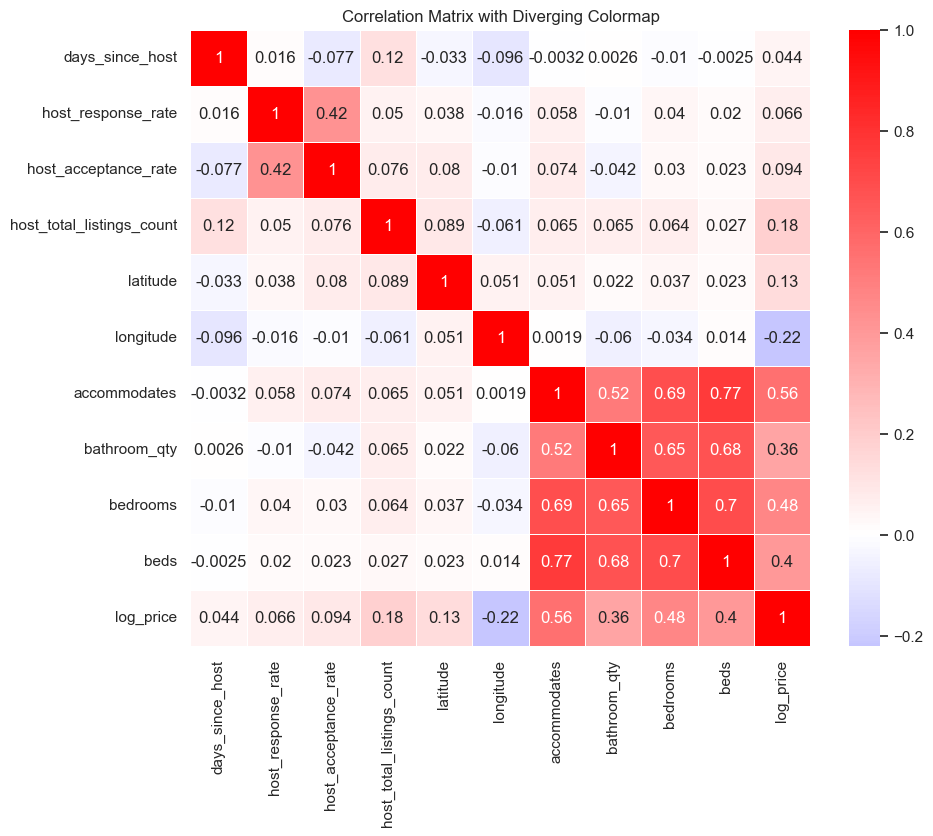

In [ ]:
import matplotlib.colors as mcolors

cmap = mcolors.LinearSegmentedColormap.from_list(
    name='red_blue',
    colors=['blue', 'white', 'red'],
    N=256
)

plt.figure(figsize=(10, 8))

# Create the heatmap
sns.heatmap(corr, annot=True, cmap=cmap, center=0, linewidths=.5)

# Adjust layout for better readability
plt.title('Correlation Matrix with Diverging Colormap')
plt.show()

Both observed in the scatterplots and the heatmap, we can see how the relationship between the "host" numeric features and the log_price is not very significant. From scatterplot we can see reposnse/acceptance rate may have a slight quadratic relationship with the label, so we'll leave those variables (as we will use a model that captures non-linear relationships). 

In [ ]:
listings_prep = listings.copy()

listings_prep =listings_prep.drop('days_since_host', axis=1)

We also observe multicolinearity between variables accommodates, baths, beds, and bedrooms, but we'll leave the variables as bads and beds, for example, are things my grandparents could individually change to charge more. As we are using NNs, we have more tolerance over these situation. Now, what about location?

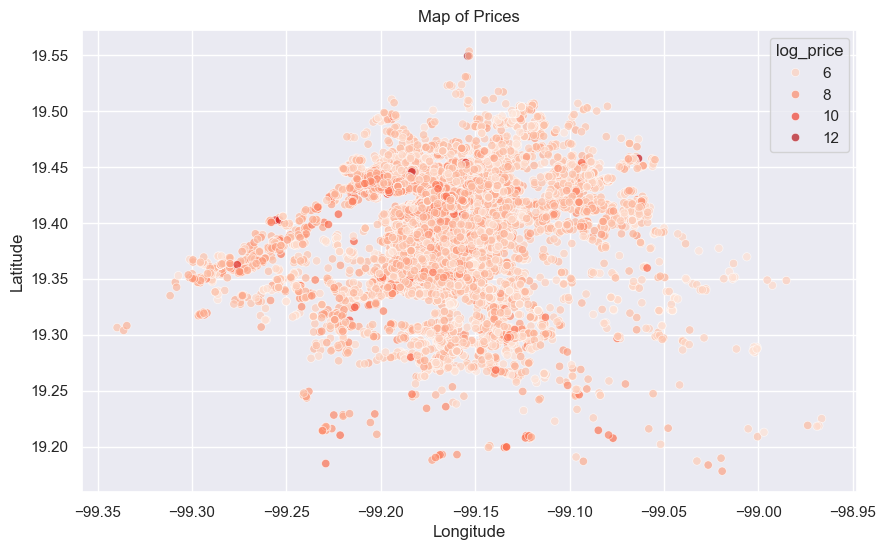

In [ ]:
# Assuming your DataFrame is named df and has 'latitude', 'longitude', and 'log_price' columns
plt.figure(figsize=(10, 6))

# Scatter plot with log_price as hue
sns.scatterplot(data=listings, x='longitude', y='latitude', hue='log_price', palette='Reds', alpha=.7)

plt.title('Map of Prices')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [ ]:
import folium

# Create a map centered around Mexico City
mexico_city_map = folium.Map(location=[19.4326, -99.1332], zoom_start=12)

# Function to determine color based on log_price
def price_to_color(log_price):
    if log_price < 6: 
        return 'green'
    elif log_price < 8:
        return 'blue'
    else:
        return 'red'

# Add points to the map
for _, row in listings.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=price_to_color(row['log_price']),
        fill=True,
        fill_opacity=.6,
    ).add_to(mexico_city_map)

# Display the map
mexico_city_map

We can observe how we do have areas where the higher prices are located as the surroundings of Chapultepec (Polanco, Reforma). We will use the latitude and longitude as features (ussing tensorflow feature cross variable).
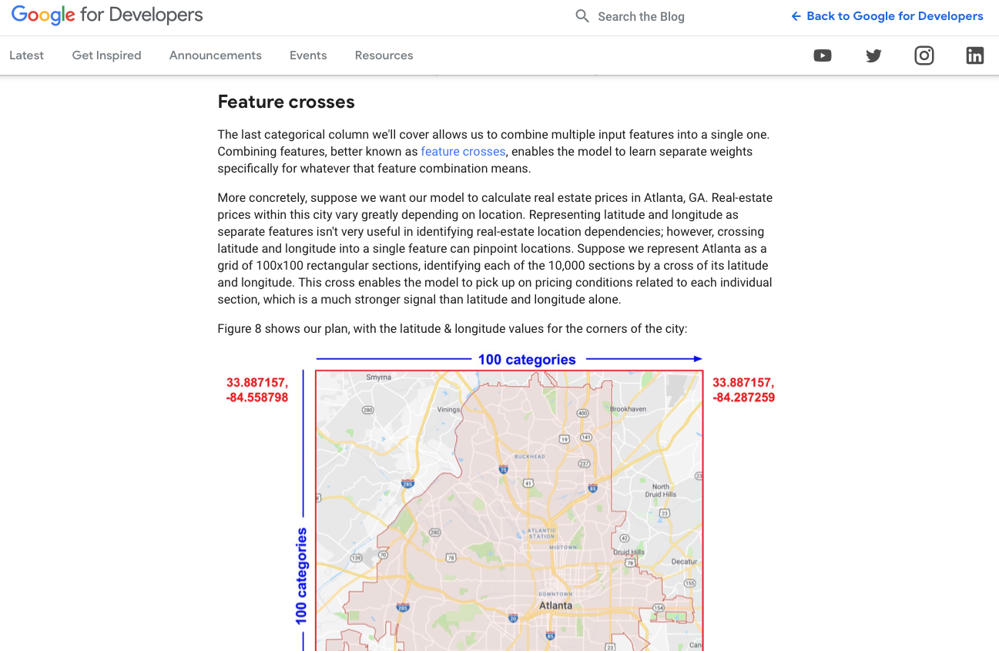

## 3. Categorical Features

In [ ]:
listings[categorical].nunique()

host_response_time                4
host_is_superhost                 2
host_verifications_email          2
host_verifications_phone          2
host_verifications_work_email     2
host_has_profile_pic              2
host_identity_verified            2
neighbourhood_cleansed           16
room_type                         4
property_description             44
bathroom_type                     3
gym                               2
wifi                              2
pool                              2
kitchen                           2
parking                           2
washer                            2
dryer                             2
conditioning                      2
heating                           2
workspace                         2
tv                                2
hair dryer                        2
iron                              2
hot tub                           2
crib                              2
king bed                          1
bbq                         

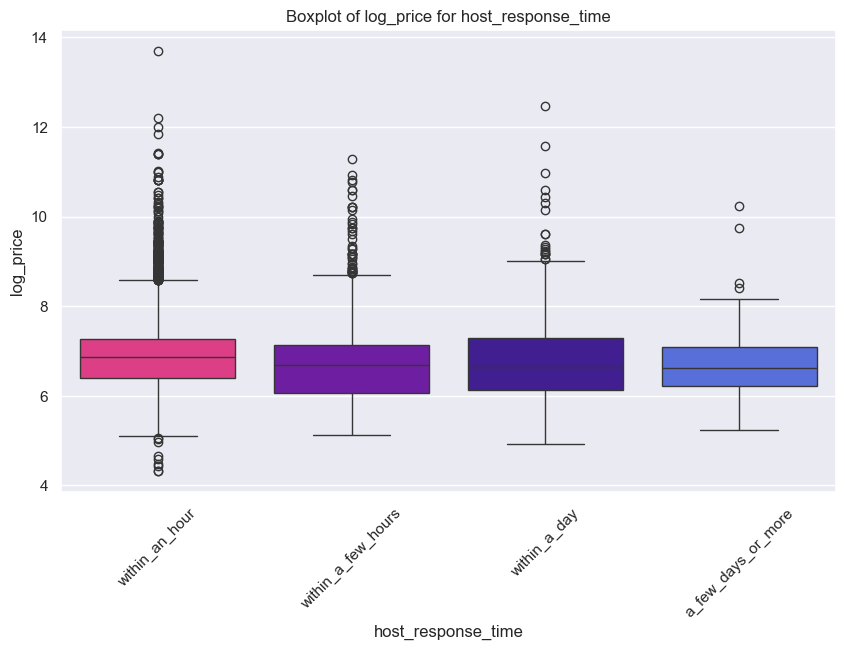

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    
    cat_var = 'host_response_time'
    order = ['within_an_hour', 'within_a_few_hours', 'within_a_day', 'a_few_days_or_more']
    
    plt.figure(figsize=(10, 6))
    
    sns.boxplot(x=cat_var, y='log_price', data=listings, palette=palette, order=order)
    plt.title(f'Boxplot of log_price for {cat_var}')
    plt.xticks(rotation=45)  # Rotate x labels for better readability if needed
    plt.show()

We do observe price going down when the response time gets increases.

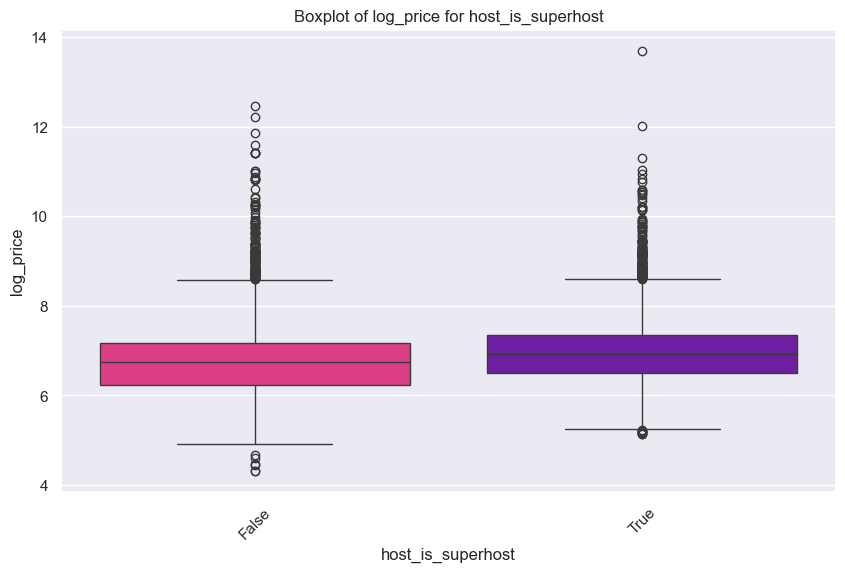

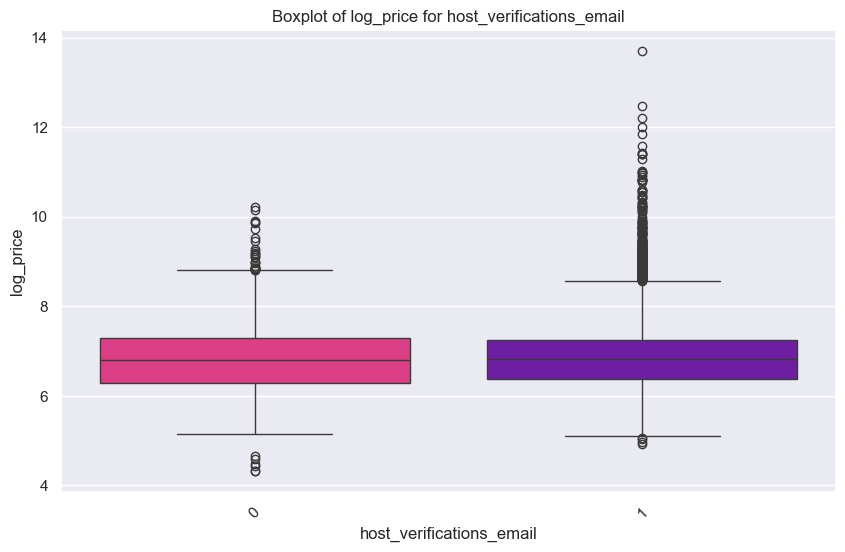

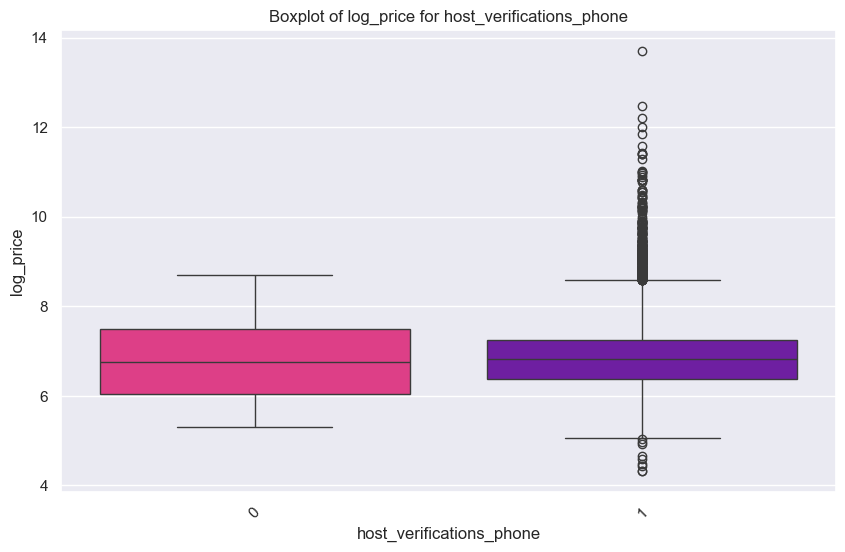

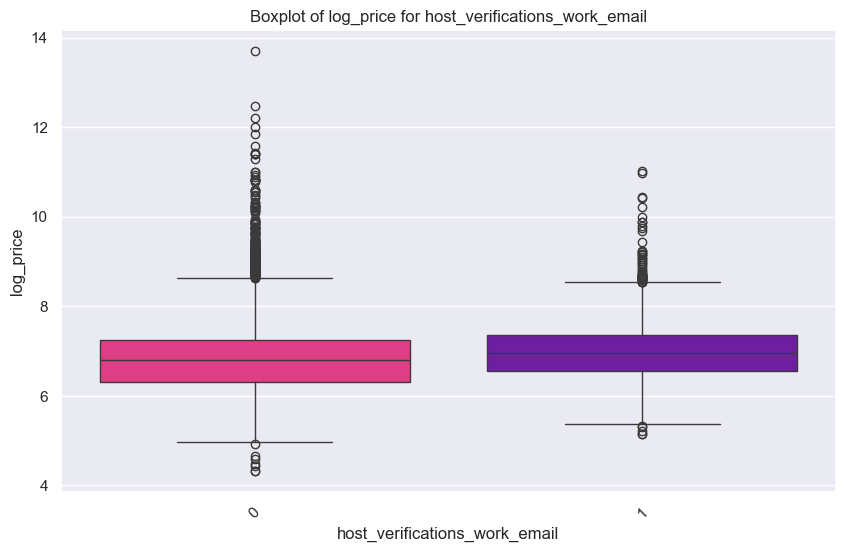

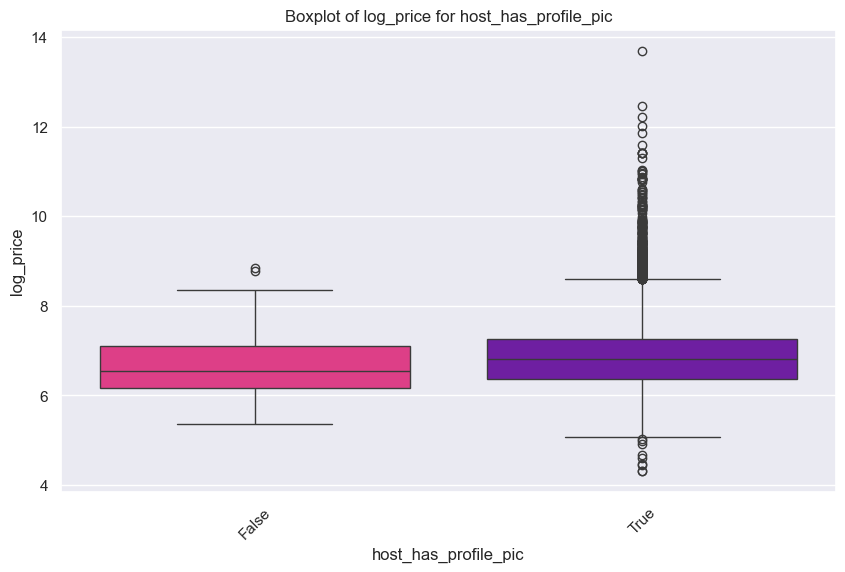

...

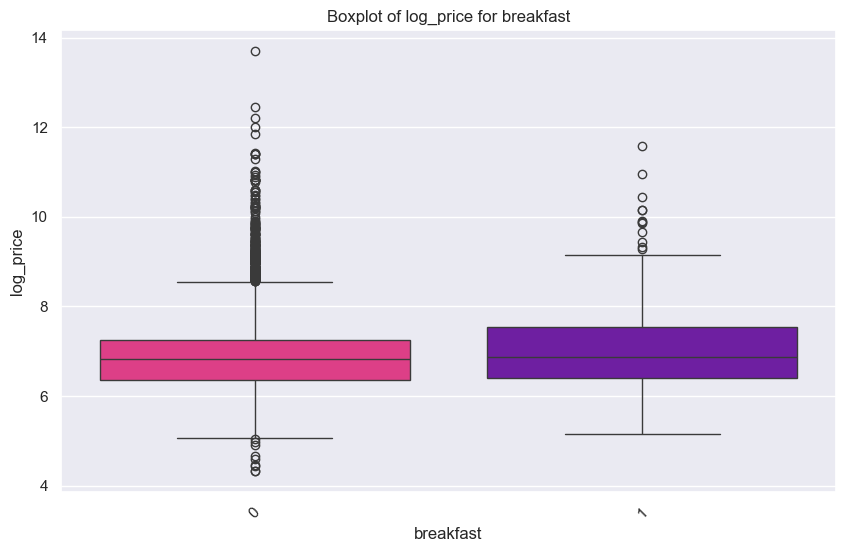

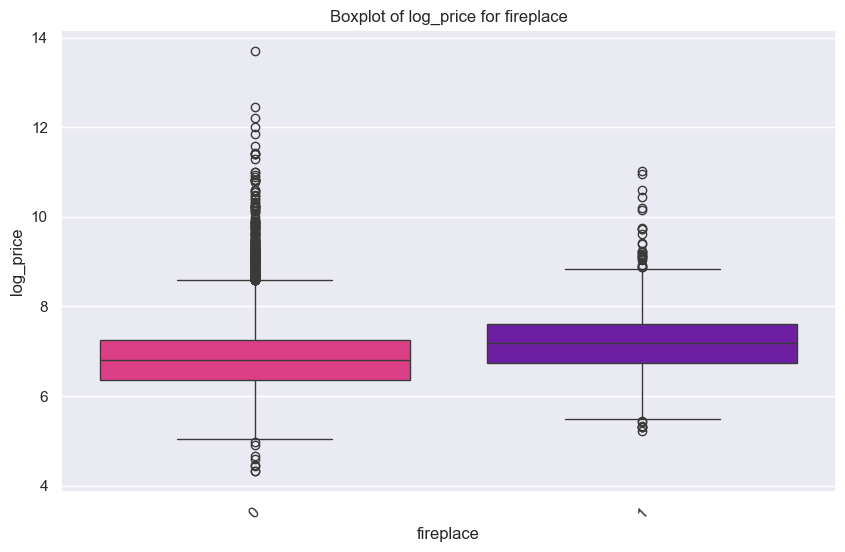

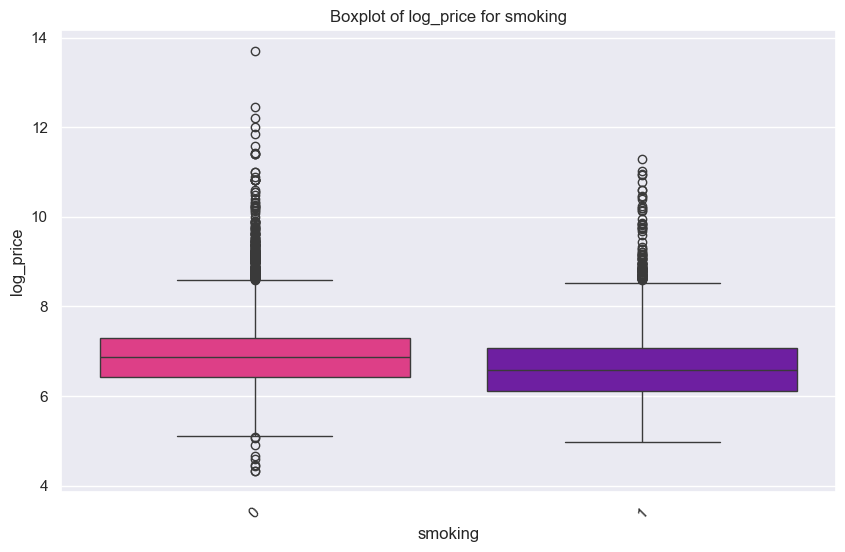

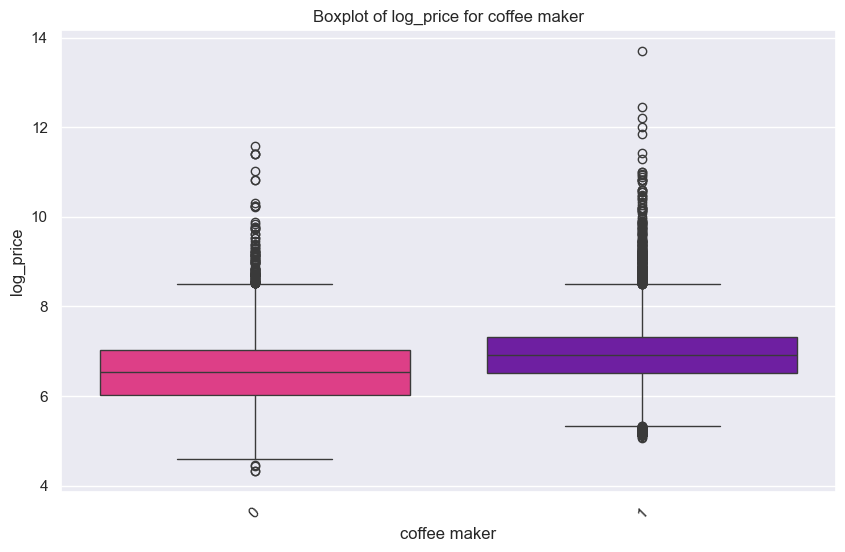

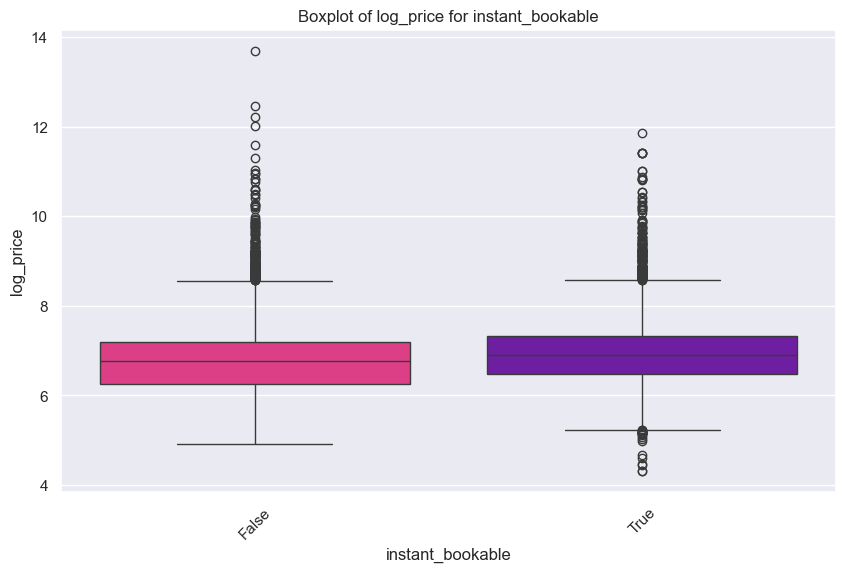

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')

    aux_categorical=categorical.copy()
    aux_categorical.remove('host_response_time')
    
    for cat_var in aux_categorical:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_var, y='log_price', data=listings, palette=palette)
        plt.title(f'Boxplot of log_price for {cat_var}')
        plt.xticks(rotation=45)  # Rotate x labels for better readability if needed
        plt.show()

You can observe how amenities do, of course, affect the price! Let's do some final validations before removing the variables that affect less the price:

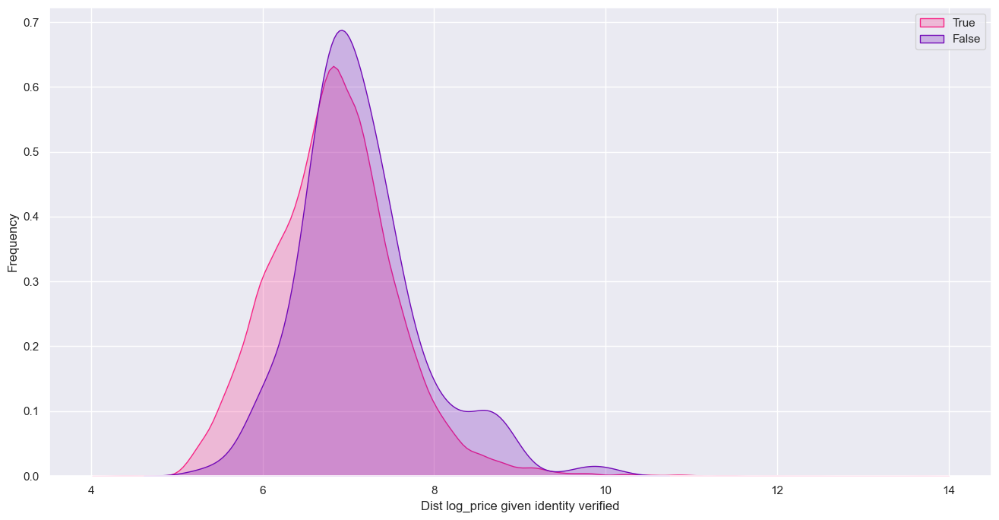

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(16, 8))

sns.kdeplot(listings[listings.host_identity_verified==1].log_price, fill=True, color=palette[0], label='True', ax=axs)
sns.kdeplot(listings[listings.host_identity_verified==0].log_price, fill=True, color=palette[1], label='False', ax=axs)

axs.set_xlabel('Dist log_price given identity verified')
axs.set_ylabel('Frequency')
axs.legend()

plt.show()

Identity verified does not affect as much in the mexican market! (ex. in NY market is a key feature)

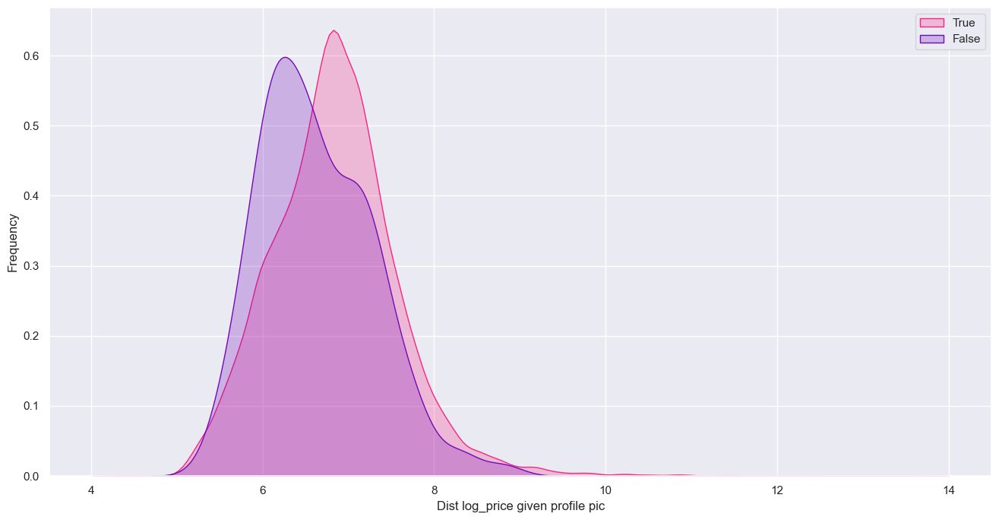

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(16, 8))

sns.kdeplot(listings[listings.host_has_profile_pic==1].log_price, fill=True, color=palette[0], label='True', ax=axs)
sns.kdeplot(listings[listings.host_has_profile_pic==0].log_price, fill=True, color=palette[1], label='False', ax=axs)

axs.set_xlabel('Dist log_price given profile pic')
axs.set_ylabel('Frequency')
axs.legend()

plt.show()

Host having a profile picture does relate with the base price!

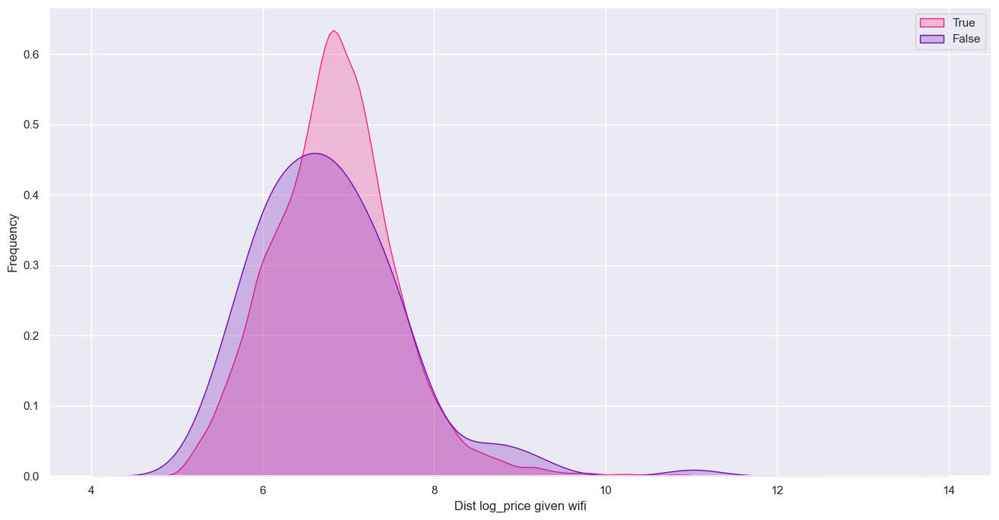

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(16, 8))

sns.kdeplot(listings[listings.wifi==1].log_price, fill=True, color=palette[0], label='True', ax=axs)
sns.kdeplot(listings[listings.wifi==0].log_price, fill=True, color=palette[1], label='False', ax=axs)

axs.set_xlabel('Dist log_price given wifi')
axs.set_ylabel('Frequency')
axs.legend()

plt.show()

In [ ]:
listings.groupby(
    ["wifi"], as_index=False
).agg(
    avg_price = ("log_price","mean"),
    qty = ("log_price","count")
).sort_values(
    by="avg_price", ascending=False
).reset_index(drop=True)

,wifi,avg_price,qty
0,1,6.837486,20431
1,0,6.776039,142


Having or not wifi does not substantially affect the price of the units (mayority of units with wifi of course). Situation can be due to people blindly believing there are internet services.

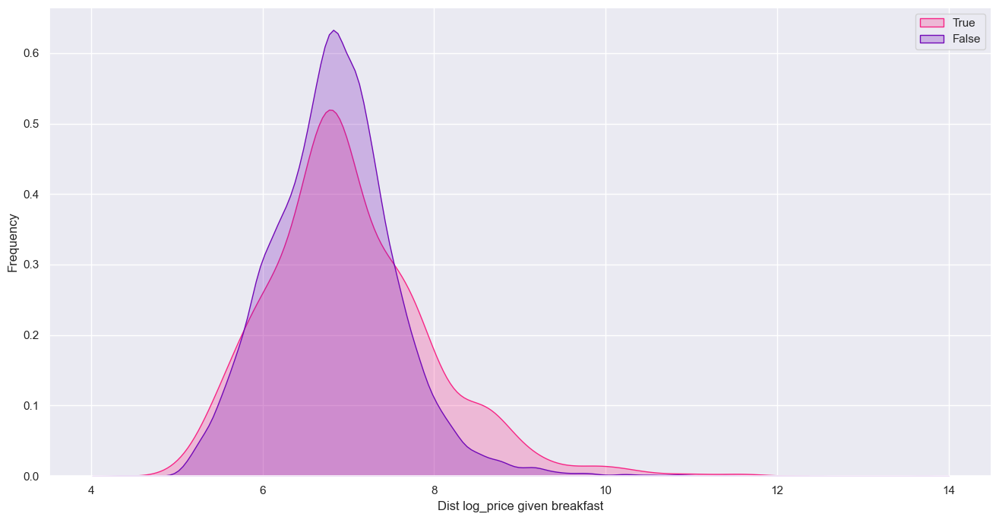

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(16, 8))

sns.kdeplot(listings[listings.breakfast==1].log_price, fill=True, color=palette[0], label='True', ax=axs)
sns.kdeplot(listings[listings.breakfast==0].log_price, fill=True, color=palette[1], label='False', ax=axs)

axs.set_xlabel('Dist log_price given breakfast')
axs.set_ylabel('Frequency')
axs.legend()

plt.show()

In [ ]:
listings.groupby(
    ["breakfast"], as_index=False
).agg(
    avg_price = ("log_price","mean"),
    qty = ("log_price","count")
).sort_values(
    by="avg_price", ascending=False
).reset_index(drop=True)

,breakfast,avg_price,qty
0,1,7.004135,572
1,0,6.832284,20001


We will remove categorical variables: days since host, host verification email and phone (having a second verification email does affect the base price), identity verified. And for amenities, we will remove: wifi, king bed (we have an error in the creation of this variable, it's false for all observations), breakfast.

In [ ]:
numerical = [
            'host_response_rate', 'host_acceptance_rate', 'host_total_listings_count', 
            'latitude','longitude', 'accommodates', 'bathroom_qty', 'bedrooms', 'beds',
            ]
categorical = [
                'host_response_time','host_is_superhost', 
                'host_verifications_work_email','host_has_profile_pic',
                'neighbourhood_cleansed', 'room_type', 'property_description', 'bathroom_type', 
                'gym','pool','kitchen','parking','washer','dryer','conditioning','heating','workspace',
                'tv','hair dryer','iron','hot tub','crib','bbq','fireplace','smoking', 'coffee maker', 
               'instant_bookable',
              ]
label=['price']

In [ ]:
listings_prep = listings[numerical+categorical+label]

In [ ]:
listings_prep.shape

(20573, 37)

# Saving Data

In [ ]:
# Specify the path where you want to save the DataFrame
file_path = '../data/listings_features_selected.pkl'

# Save the DataFrame to a Pickle file
listings_prep.to_pickle(file_path)